In [120]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.ensemble import IsolationForest

print("Libraries imported successfully!")

Libraries imported successfully!


In [121]:
data_path = "/content/sri_lanka_census_2024_district_ml_dataset.csv"
dictionary_path = "/content/sri_lanka_census_2024_data_dictionary.csv"

df = pd.read_csv(data_path)
data_dictionary = pd.read_csv(dictionary_path)

print("Dataset shape:", df.shape)
print("Data dictionary shape:", data_dictionary.shape)

Dataset shape: (25, 53)
Data dictionary shape: (53, 6)


In [122]:
df.head()

,district,province,population_2024,population_share_sri_lanka_pct,avg_annual_population_growth_2012_2024_pct,population_density_2024_per_sq_km,urban_population_pct,estate_urban_population_pct,rural_population_pct,estate_rural_population_pct,...,permanent_housing_units_pct,semi_permanent_housing_units_pct,improvised_housing_units_pct,drinking_water_within_housing_unit_pct,drinking_water_within_premises_pct,drinking_water_outside_premises_pct,households_using_firewood_for_cooking_pct,households_using_gas_for_cooking_pct,water_sealed_toilet_pct,not_water_sealed_toilet_pct
0,Colombo,Western,2375415,10.9,0.2,3551,74.6,0.2,25.0,0.2,...,98.6,1.3,0.0,97.2,2.1,0.7,9.9,85.5,99.9,0.1
1,Gampaha,Western,2436142,11.2,0.4,1776,14.4,0.0,85.6,0.0,...,98.7,1.2,0.1,89.6,7.3,3.1,31.8,63.9,99.8,0.2
2,Kalutara,Western,1305784,6.0,0.5,805,11.5,0.1,85.8,2.6,...,97.9,2.1,0.0,89.8,6.4,3.8,42.4,55.9,99.7,0.3
3,Kandy,Central,1461895,6.7,0.5,780,11.7,0.0,82.7,5.6,...,94.7,5.2,0.1,86.4,8.9,4.7,58.3,40.3,99.4,0.6
4,Matale,Central,526870,2.4,0.7,268,11.9,0.0,84.9,3.2,...,94.2,5.7,0.1,76.6,12.7,10.6,75.5,23.5,98.8,1.1


In [123]:
df.columns.tolist()

['district',
 'province',
 'population_2024',
 'population_share_sri_lanka_pct',
 'avg_annual_population_growth_2012_2024_pct',
 'population_density_2024_per_sq_km',
 'urban_population_pct',
 'estate_urban_population_pct',
 'rural_population_pct',
 'estate_rural_population_pct',
 'population_under_18_count',
 'population_under_18_pct',
 'disability_rate_per_1000_age5plus',
 'population_age25plus_2024',
 'education_no_schooling_pct_age25plus',
 'education_grades_1_5_pct_age25plus',
 'education_grades_6_10_pct_age25plus',
 'education_ol_pct_age25plus',
 'education_al_or_over_pct_age25plus',
 'computer_literacy_rate_pct_age5plus',
 'digital_literacy_rate_pct_age5plus',
 'labour_force_2024_count',
 'employment_rate_pct',
 'unemployment_rate_pct',
 'in_migration_2024_count',
 'out_migration_2024_count',
 'net_migration_2024_count',
 'in_migration_per_1000_population_derived',
 'out_migration_per_1000_population_derived',
 'net_migration_per_1000_population_derived',
 'households_2024_count'

In [124]:
data_dictionary.head(20)

,column,definition,unit,source_table,report_page,derived
0,district,District name standardized to official common ...,category,Multiple district tables,multiple,False
1,province,Province containing district,category,Table 3.2,51,False
2,population_2024,"Total population in district, 2024",persons,Table 3.2,51,False
3,population_share_sri_lanka_pct,District share of Sri Lanka population,percent,Table 3.2,51,False
4,avg_annual_population_growth_2012_2024_pct,Average annual population growth rate from 201...,percent per year,Table 3.3,52,False
5,population_density_2024_per_sq_km,Population density in 2024,persons per sq km,Table 3.4,53,False
6,urban_population_pct,Share of district population in Urban sector,percent,Table 3.6,55,False
7,estate_urban_population_pct,Share of district population in Estate Urban s...,percent,Table 3.6,55,False
8,rural_population_pct,Share of district population in Rural sector,percent,Table 3.6,55,False
9,estate_rural_population_pct,Share of district population in Estate Rural s...,percent,Table 3.6,55,False


In [125]:
data_dictionary.columns

Index(['column', 'definition', 'unit', 'source_table', 'report_page',
       'derived'],
      dtype='object')

In [126]:
data_dictionary[
    data_dictionary["column"] == "digital_literacy_rate_pct_age5plus"
]

,column,definition,unit,source_table,report_page,derived
20,digital_literacy_rate_pct_age5plus,Digital literacy rate among population aged 5+,percent,Table 7.13,142,False


In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   district                                    25 non-null     object 
 1   province                                    25 non-null     object 
 2   population_2024                             25 non-null     int64  
 3   population_share_sri_lanka_pct              25 non-null     float64
 4   avg_annual_population_growth_2012_2024_pct  25 non-null     float64
 5   population_density_2024_per_sq_km           25 non-null     int64  
 6   urban_population_pct                        25 non-null     float64
 7   estate_urban_population_pct                 25 non-null     float64
 8   rural_population_pct                        25 non-null     float64
 9   estate_rural_population_pct                 25 non-null     float64
 10  population_under

In [128]:
df.isnull().sum()

,0
district,0
province,0
population_2024,0
population_share_sri_lanka_pct,0
avg_annual_population_growth_2012_2024_pct,0
population_density_2024_per_sq_km,0
urban_population_pct,0
estate_urban_population_pct,0
rural_population_pct,0
estate_rural_population_pct,0


In [129]:
missing = df.isnull().sum()

missing[missing > 0]

,0


In [130]:
df["district"].duplicated().sum()

np.int64(0)

In [131]:
df["district"].nunique()

25

In [132]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
population_2024,25.0,871272.000000,618069.819686,122619.0000,526870.0000,744551.0000,1.097372e+06,2.436142e+06
population_share_sri_lanka_pct,25.0,3.996000,2.837029,0.6000,2.4000,3.4000,5.000000e+00,1.120000e+01
avg_annual_population_growth_2012_2024_pct,25.0,0.712000,0.540309,0.0000,0.3000,0.6000,1.000000e+00,2.200000e+00
population_density_2024_per_sq_km,25.0,521.240000,730.080091,51.0000,147.0000,278.0000,6.310000e+02,3.551000e+03
urban_population_pct,25.0,13.224000,14.883584,0.0000,5.1000,11.5000,1.660000e+01,7.460000e+01
estate_urban_population_pct,25.0,0.048000,0.163605,0.0000,0.0000,0.0000,0.000000e+00,8.000000e-01
rural_population_pct,25.0,82.684000,16.898069,25.0000,80.5000,85.6000,9.200000e+01,1.000000e+02
estate_rural_population_pct,25.0,4.044000,10.690186,0.0000,0.0000,0.1000,2.600000e+00,5.170000e+01
population_under_18_count,25.0,223732.160000,137326.345886,35280.0000,142315.0000,214513.0000,2.735930e+05,5.509470e+05
population_under_18_pct,25.0,26.987916,2.625248,20.9576,25.1882,27.5045,2.857190e+01,3.214380e+01


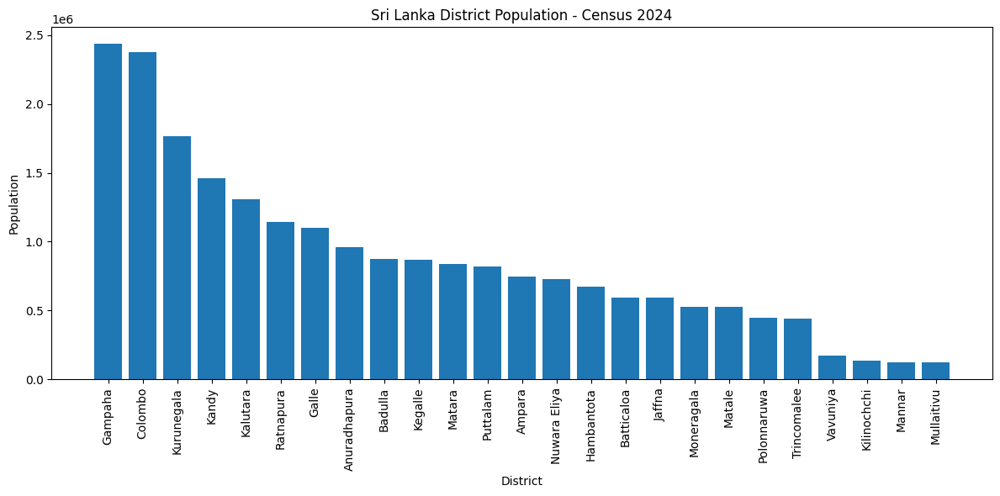

In [133]:
population_sorted = df.sort_values(
    "population_2024",
    ascending=False
)

plt.figure(figsize=(12, 6))

plt.bar(
    population_sorted["district"],
    population_sorted["population_2024"]
)

plt.xticks(rotation=90)
plt.xlabel("District")
plt.ylabel("Population")
plt.title("Sri Lanka District Population - Census 2024")

plt.tight_layout()
plt.show()

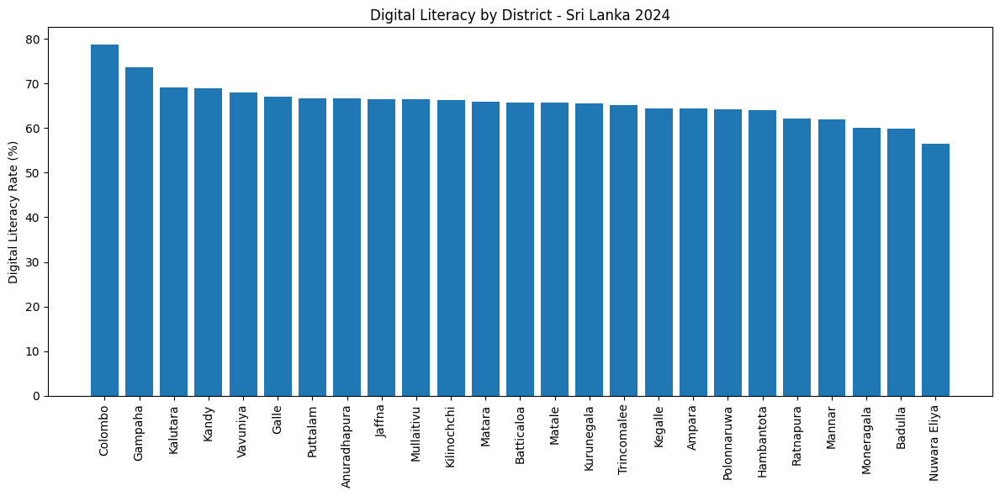

In [134]:
digital_sorted = df.sort_values(
    "digital_literacy_rate_pct_age5plus",
    ascending=False
)

plt.figure(figsize=(12, 6))

plt.bar(
    digital_sorted["district"],
    digital_sorted["digital_literacy_rate_pct_age5plus"]
)

plt.xticks(rotation=90)
plt.ylabel("Digital Literacy Rate (%)")
plt.title("Digital Literacy by District - Sri Lanka 2024")

plt.tight_layout()
plt.show()

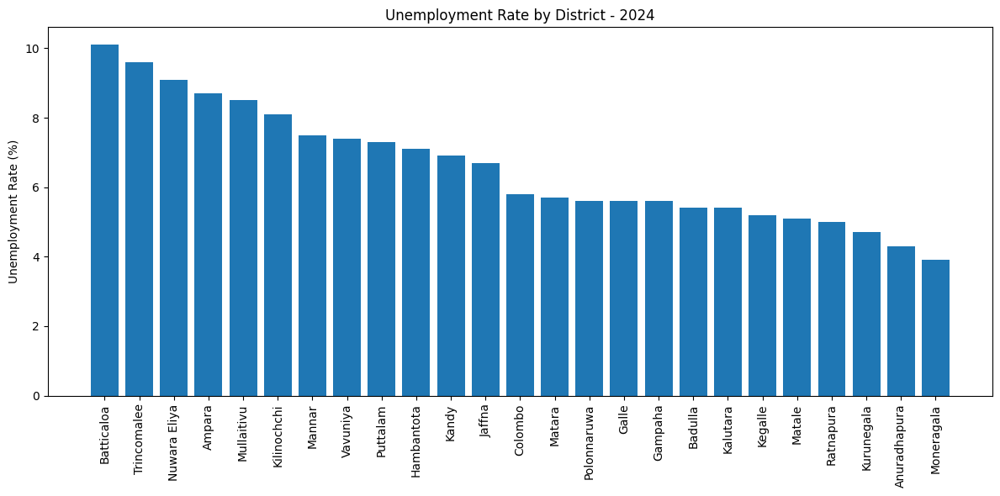

In [135]:
unemployment_sorted = df.sort_values(
    "unemployment_rate_pct",
    ascending=False
)

plt.figure(figsize=(12, 6))

plt.bar(
    unemployment_sorted["district"],
    unemployment_sorted["unemployment_rate_pct"]
)

plt.xticks(rotation=90)
plt.ylabel("Unemployment Rate (%)")
plt.title("Unemployment Rate by District - 2024")

plt.tight_layout()
plt.show()

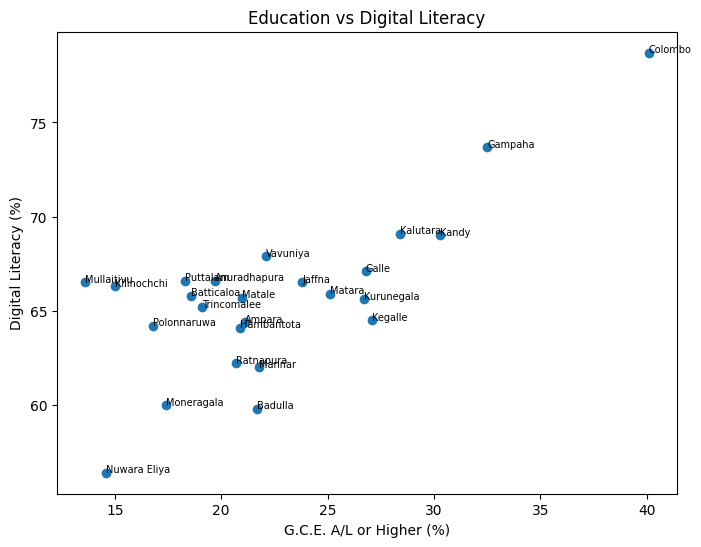

In [136]:
plt.figure(figsize=(8, 6))

plt.scatter(
    df["education_al_or_over_pct_age25plus"],
    df["digital_literacy_rate_pct_age5plus"]
)

for i in range(len(df)):
    plt.annotate(
        df["district"].iloc[i],
        (
            df["education_al_or_over_pct_age25plus"].iloc[i],
            df["digital_literacy_rate_pct_age5plus"].iloc[i]
        ),
        fontsize=7
    )

plt.xlabel("G.C.E. A/L or Higher (%)")
plt.ylabel("Digital Literacy (%)")
plt.title("Education vs Digital Literacy")

plt.show()

In [137]:
numeric_df = df.select_dtypes(include=np.number)

correlation_matrix = numeric_df.corr()

correlation_matrix.head()

,population_2024,population_share_sri_lanka_pct,avg_annual_population_growth_2012_2024_pct,population_density_2024_per_sq_km,urban_population_pct,estate_urban_population_pct,rural_population_pct,estate_rural_population_pct,population_under_18_count,population_under_18_pct,...,permanent_housing_units_pct,semi_permanent_housing_units_pct,improvised_housing_units_pct,drinking_water_within_housing_unit_pct,drinking_water_within_premises_pct,drinking_water_outside_premises_pct,households_using_firewood_for_cooking_pct,households_using_gas_for_cooking_pct,water_sealed_toilet_pct,not_water_sealed_toilet_pct
population_2024,1.000000,0.999952,-0.477332,0.795954,0.419305,0.105033,-0.364005,-0.010005,0.987420,-0.732233,...,0.514390,-0.413102,-0.421238,0.711684,-0.714170,-0.551931,-0.525734,0.527782,0.575352,-0.542656
population_share_sri_lanka_pct,0.999952,1.000000,-0.475111,0.795558,0.418227,0.103666,-0.362040,-0.011589,0.987040,-0.733046,...,0.514999,-0.414160,-0.419358,0.711759,-0.714461,-0.551490,-0.524571,0.526567,0.575452,-0.542684
avg_annual_population_growth_2012_2024_pct,-0.477332,-0.475111,1.000000,-0.418123,-0.225165,-0.303742,0.399704,-0.313677,-0.471029,0.625910,...,-0.251768,0.122266,0.495533,-0.462663,0.498048,0.283130,0.245343,-0.257294,-0.210526,0.216805
population_density_2024_per_sq_km,0.795954,0.795558,-0.418123,1.000000,0.772934,0.189213,-0.655238,-0.043286,0.708764,-0.737828,...,0.533311,-0.487038,-0.284523,0.496419,-0.460736,-0.469966,-0.746628,0.747239,0.494801,-0.453989
urban_population_pct,0.419305,0.418227,-0.225165,0.772934,1.000000,0.088315,-0.774584,-0.169226,0.347188,-0.301367,...,0.359402,-0.389869,0.001294,0.199937,-0.138044,-0.296327,-0.829259,0.827808,0.326059,-0.291305


In [138]:
features = [

    # Demography
    "avg_annual_population_growth_2012_2024_pct",
    "population_density_2024_per_sq_km",
    "urban_population_pct",
    "population_under_18_pct",
    "disability_rate_per_1000_age5plus",

    # Education / Digital
    "education_no_schooling_pct_age25plus",
    "education_al_or_over_pct_age25plus",
    "computer_literacy_rate_pct_age5plus",
    "digital_literacy_rate_pct_age5plus",

    # Economy
    "unemployment_rate_pct",
    "net_migration_per_1000_population_derived",

    # Household
    "one_person_households_pct",
    "female_household_heads_pct",

    # Housing
    "housing_owned_by_household_member_pct",
    "permanent_housing_units_pct",

    # Infrastructure
    "drinking_water_within_housing_unit_pct",
    "households_using_gas_for_cooking_pct",
    "water_sealed_toilet_pct"
]

In [139]:
X = df[features].copy()

print(X.shape)

X.head()

(25, 18)


,avg_annual_population_growth_2012_2024_pct,population_density_2024_per_sq_km,urban_population_pct,population_under_18_pct,disability_rate_per_1000_age5plus,education_no_schooling_pct_age25plus,education_al_or_over_pct_age25plus,computer_literacy_rate_pct_age5plus,digital_literacy_rate_pct_age5plus,unemployment_rate_pct,net_migration_per_1000_population_derived,one_person_households_pct,female_household_heads_pct,housing_owned_by_household_member_pct,permanent_housing_units_pct,drinking_water_within_housing_unit_pct,households_using_gas_for_cooking_pct,water_sealed_toilet_pct
0,0.2,3551,74.6,20.9576,25,1.6,40.1,51.0,78.7,5.8,56.8886,10.5,27.7,76.0,98.6,97.2,85.5,99.9
1,0.4,1776,14.4,22.6156,32,1.1,32.5,42.7,73.7,5.6,151.4793,11.5,25.3,81.6,98.7,89.6,63.9,99.8
2,0.5,805,11.5,24.3313,31,1.8,28.4,37.1,69.1,5.4,50.7488,8.5,23.8,86.8,97.9,89.8,55.9,99.7
3,0.5,780,11.7,26.2194,37,3.0,30.3,38.5,69.0,6.9,-78.8935,9.5,27.0,84.6,94.7,86.4,40.3,99.4
4,0.7,268,11.9,26.9793,40,3.5,21.0,31.4,65.7,5.1,-42.4014,10.8,26.2,86.7,94.2,76.6,23.5,98.8


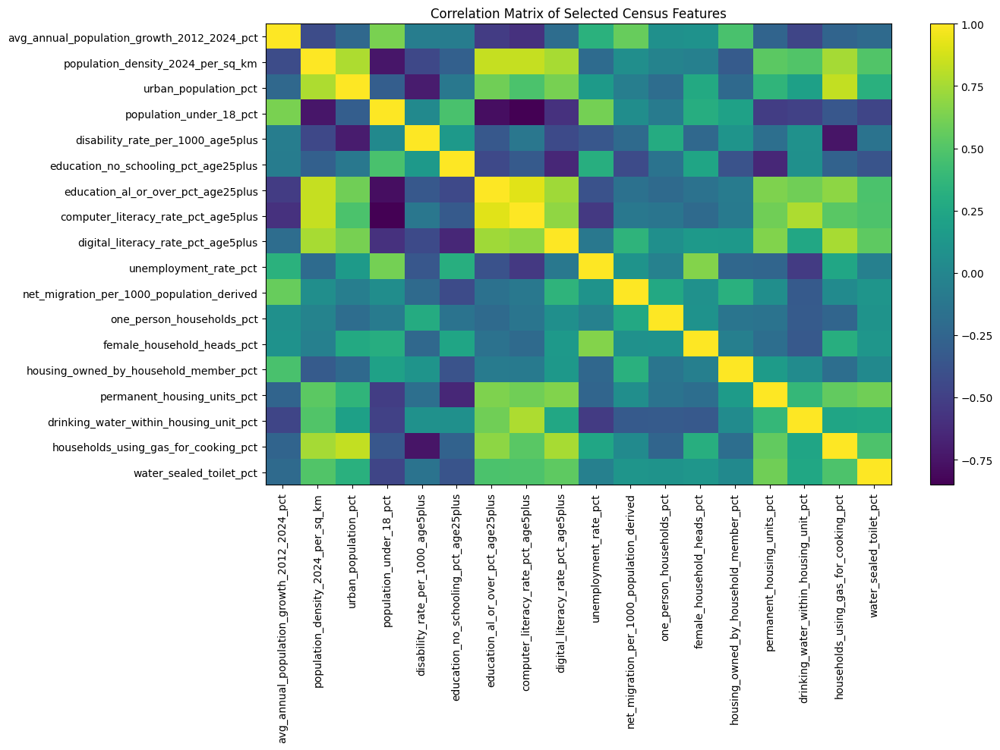

In [140]:
plt.figure(figsize=(14, 10))

plt.imshow(
    X.corr(),
    aspect="auto"
)

plt.colorbar()

plt.xticks(
    range(len(features)),
    features,
    rotation=90
)

plt.yticks(
    range(len(features)),
    features
)

plt.title("Correlation Matrix of Selected Census Features")

plt.tight_layout()
plt.show()

In [141]:
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

X_scaled

array([[-9.67147028e-01,  4.23547483e+00,  4.20877247e+00,
        -2.34441260e+00, -2.32959106e+00, -8.89454471e-01,
         2.94333750e+00,  2.89548068e+00,  3.04033339e+00,
        -4.60273277e-01,  5.03244830e-01,  2.83904609e-02,
         1.73250946e-01, -1.15221541e+00,  1.65590322e+00,
         1.40621336e+00,  2.96658380e+00,  1.59829858e+00],
       [-5.89355220e-01,  1.75410079e+00,  8.06425381e-02,
        -1.69983011e+00, -8.02705535e-01, -1.17235984e+00,
         1.67032561e+00,  1.74051674e+00,  1.86627817e+00,
        -5.79515059e-01,  1.37889952e+00,  1.21132633e+00,
        -4.34647110e-01, -4.73586223e-01,  1.71044549e+00,
         1.07198701e+00,  1.65950543e+00,  1.21409219e+00],
       [-4.00459316e-01,  3.96684337e-01, -1.18220864e-01,
        -1.03281553e+00, -1.02083204e+00, -7.76292324e-01,
         9.83569191e-01,  9.61263964e-01,  7.86147374e-01,
        -6.98756840e-01,  4.46406847e-01, -2.33748128e+00,
        -8.14583394e-01,  1.56569447e-01,  1.27410735e

In [142]:
pca = PCA(n_components=2)

X_pca = pca.fit_transform(X_scaled)

In [143]:
print(
    "PC1 explained variance:",
    round(pca.explained_variance_ratio_[0] * 100, 2),
    "%"
)

print(
    "PC2 explained variance:",
    round(pca.explained_variance_ratio_[1] * 100, 2),
    "%"
)

print(
    "Total:",
    round(sum(pca.explained_variance_ratio_) * 100, 2),
    "%"
)

PC1 explained variance: 39.16 %
PC2 explained variance: 17.54 %
Total: 56.7 %


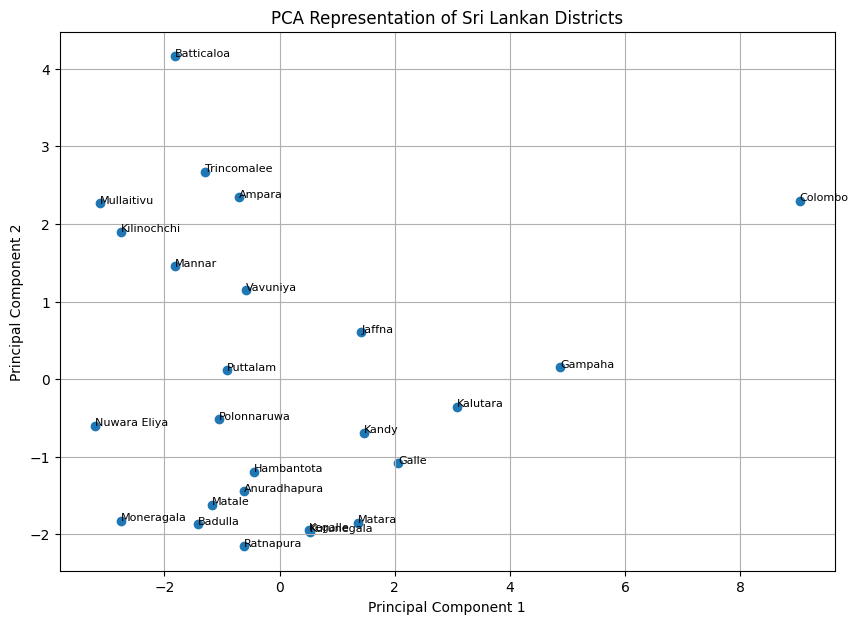

In [144]:
plt.figure(figsize=(10, 7))

plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1]
)

for i, district in enumerate(df["district"]):

    plt.annotate(
        district,
        (X_pca[i, 0], X_pca[i, 1]),
        fontsize=8
    )

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.title(
    "PCA Representation of Sri Lankan Districts"
)

plt.grid()

plt.show()

In [145]:
inertia = []
silhouette_scores = []

k_values = range(2, 8)

for k in k_values:

    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=20
    )

    labels = kmeans.fit_predict(X_scaled)

    inertia.append(kmeans.inertia_)

    silhouette_scores.append(
        silhouette_score(X_scaled, labels)
    )

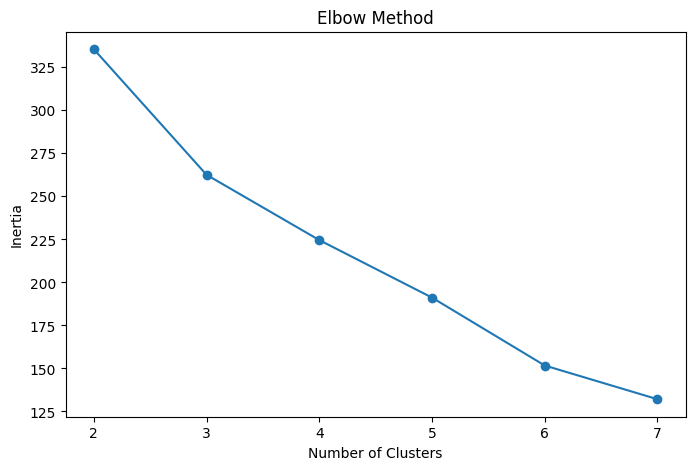

In [146]:
plt.figure(figsize=(8, 5))

plt.plot(
    list(k_values),
    inertia,
    marker="o"
)

plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")

plt.title("Elbow Method")

plt.show()

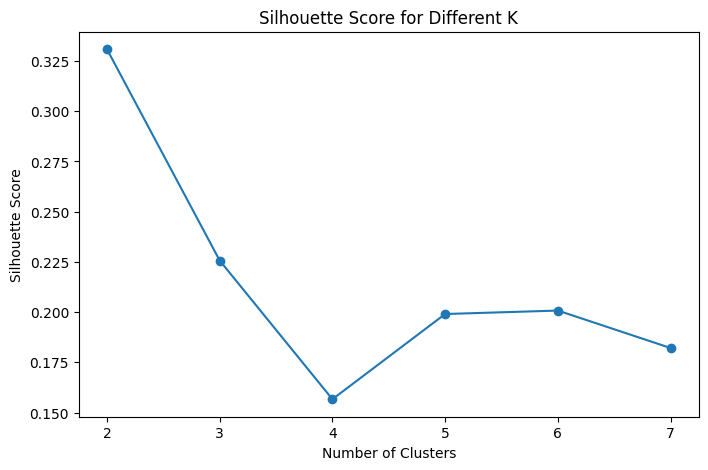

In [147]:
plt.figure(figsize=(8, 5))

plt.plot(
    list(k_values),
    silhouette_scores,
    marker="o"
)

plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")

plt.title("Silhouette Score for Different K")

plt.show()

In [148]:
best_k = 3

kmeans = KMeans(
    n_clusters=best_k,
    random_state=42,
    n_init=20
)

df["cluster"] = kmeans.fit_predict(X_scaled)

In [149]:
df[
    ["district", "province", "cluster"]
].sort_values("cluster")

,district,province,cluster
3,Kandy,Central,0
2,Kalutara,Western,0
6,Galle,Southern,0
4,Matale,Central,0
7,Matara,Southern,0
8,Hambantota,Southern,0
9,Jaffna,Northern,0
17,Kurunegala,North Western,0
24,Kegalle,Sabaragamuwa,0
23,Ratnapura,Sabaragamuwa,0


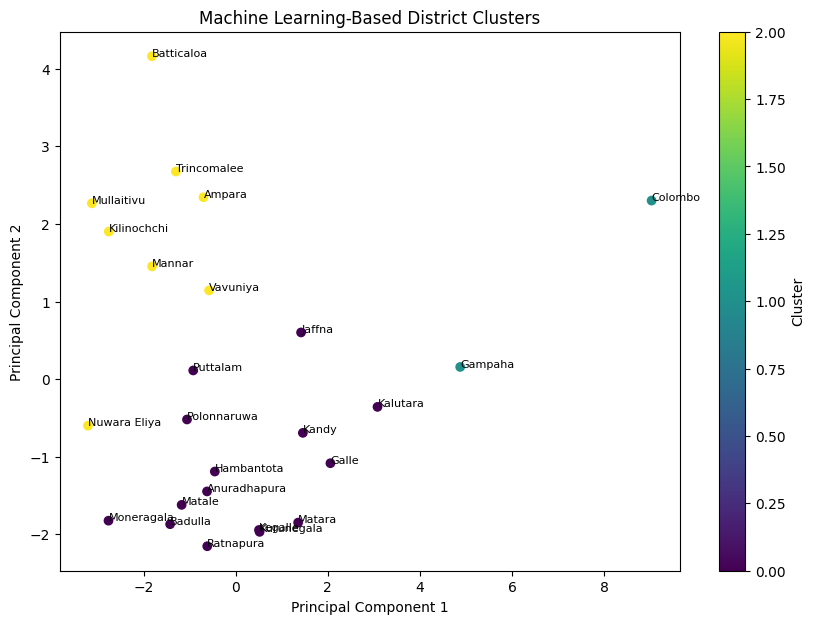

In [150]:
plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1],
    c=df["cluster"]
)

for i, district in enumerate(df["district"]):

    plt.annotate(
        district,
        (X_pca[i, 0], X_pca[i, 1]),
        fontsize=8
    )

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")

plt.title(
    "Machine Learning-Based District Clusters"
)

plt.colorbar(scatter, label="Cluster")

plt.show()

In [151]:
for cluster in sorted(df["cluster"].unique()):

    print("\nCLUSTER", cluster)

    districts = df[
        df["cluster"] == cluster
    ]["district"].tolist()

    print(districts)


CLUSTER 0
['Kalutara', 'Kandy', 'Matale', 'Galle', 'Matara', 'Hambantota', 'Jaffna', 'Kurunegala', 'Puttalam', 'Anuradhapura', 'Polonnaruwa', 'Badulla', 'Moneragala', 'Ratnapura', 'Kegalle']

CLUSTER 1
['Colombo', 'Gampaha']

CLUSTER 2
['Nuwara Eliya', 'Mannar', 'Vavuniya', 'Mullaitivu', 'Kilinochchi', 'Batticaloa', 'Ampara', 'Trincomalee']


In [152]:
cluster_profile = df.groupby("cluster")[features].mean()

cluster_profile

,avg_annual_population_growth_2012_2024_pct,population_density_2024_per_sq_km,urban_population_pct,population_under_18_pct,disability_rate_per_1000_age5plus,education_no_schooling_pct_age25plus,education_al_or_over_pct_age25plus,computer_literacy_rate_pct_age5plus,digital_literacy_rate_pct_age5plus,unemployment_rate_pct,net_migration_per_1000_population_derived,one_person_households_pct,female_household_heads_pct,housing_owned_by_household_member_pct,permanent_housing_units_pct,drinking_water_within_housing_unit_pct,households_using_gas_for_cooking_pct,water_sealed_toilet_pct
cluster,,,,,,,,,,,,,,,,,,
0,0.566667,422.533333,8.493333,26.285487,37.866667,3.066667,22.9800,31.7600,65.126667,5.593333,-31.364407,10.406667,25.5000,87.446667,95.646667,73.793333,30.406667,99.493333
1,0.300000,2663.500000,44.500000,21.786600,28.500000,1.350000,36.3000,46.8500,76.200000,5.700000,104.183950,11.000000,26.5000,78.800000,98.650000,93.400000,74.700000,99.850000
2,1.087500,170.750000,14.275000,29.605300,33.375000,3.825000,18.2375,23.0875,64.312500,8.625000,40.658112,10.475000,29.9875,83.550000,94.637500,42.112500,38.300000,99.375000


In [153]:
cluster_profile.T

cluster,0,1,2
avg_annual_population_growth_2012_2024_pct,0.566667,0.30000,1.087500
population_density_2024_per_sq_km,422.533333,2663.50000,170.750000
urban_population_pct,8.493333,44.50000,14.275000
population_under_18_pct,26.285487,21.78660,29.605300
disability_rate_per_1000_age5plus,37.866667,28.50000,33.375000
education_no_schooling_pct_age25plus,3.066667,1.35000,3.825000
education_al_or_over_pct_age25plus,22.980000,36.30000,18.237500
computer_literacy_rate_pct_age5plus,31.760000,46.85000,23.087500
digital_literacy_rate_pct_age5plus,65.126667,76.20000,64.312500
unemployment_rate_pct,5.593333,5.70000,8.625000


In [154]:
overall_mean = df[features].mean()

cluster_comparison = (
    cluster_profile - overall_mean
)

cluster_comparison.T

cluster,0,1,2
avg_annual_population_growth_2012_2024_pct,-0.145333,-0.412000,0.375500
population_density_2024_per_sq_km,-98.706667,2142.260000,-350.490000
urban_population_pct,-4.730667,31.276000,1.051000
population_under_18_pct,-0.702429,-5.201316,2.617384
disability_rate_per_1000_age5plus,2.186667,-7.180000,-2.305000
education_no_schooling_pct_age25plus,-0.105333,-1.822000,0.653000
education_al_or_over_pct_age25plus,0.452000,13.772000,-4.290500
computer_literacy_rate_pct_age5plus,1.568000,16.658000,-7.104500
digital_literacy_rate_pct_age5plus,-0.625333,10.448000,-1.439500
unemployment_rate_pct,-0.978667,-0.872000,2.053000


In [155]:
profile_scaled = pd.DataFrame(
    scaler.transform(cluster_profile),
    columns=features,
    index=cluster_profile.index
)

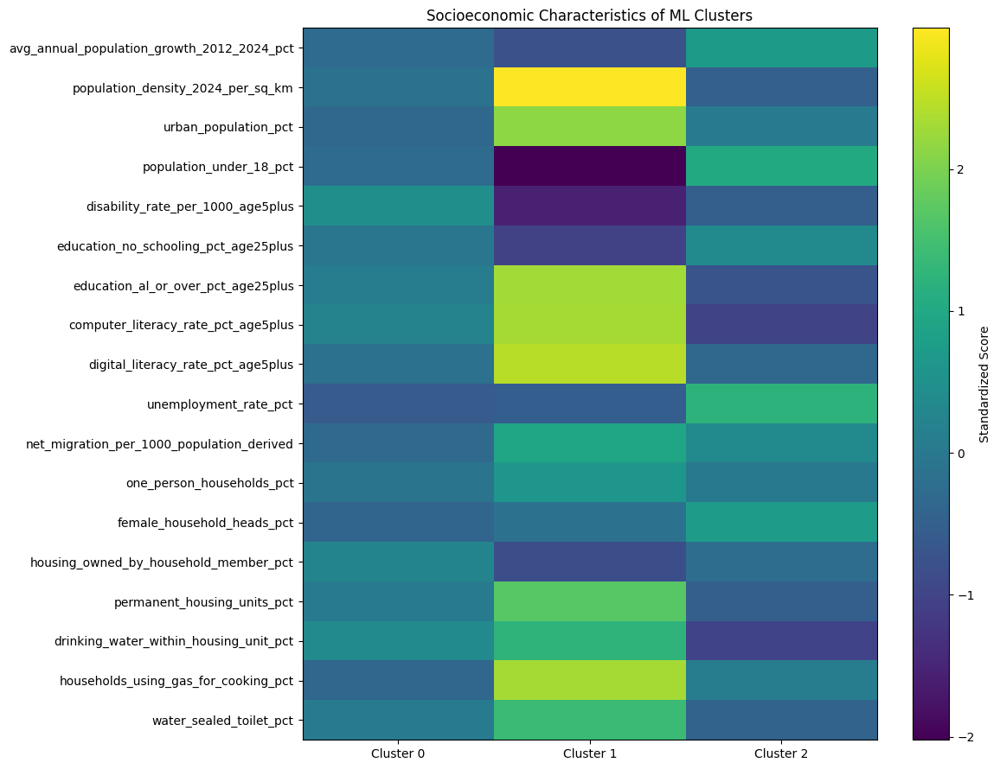

In [156]:
plt.figure(figsize=(12, 9))

plt.imshow(
    profile_scaled.T,
    aspect="auto"
)

plt.colorbar(label="Standardized Score")

plt.xticks(
    range(len(profile_scaled.index)),
    [
        f"Cluster {i}"
        for i in profile_scaled.index
    ]
)

plt.yticks(
    range(len(features)),
    features
)

plt.title(
    "Socioeconomic Characteristics of ML Clusters"
)

plt.tight_layout()

plt.show()

In [157]:
hierarchical = AgglomerativeClustering(
    n_clusters=best_k
)

df["hierarchical_cluster"] = (
    hierarchical.fit_predict(X_scaled)
)

In [158]:
df[
    [
        "district",
        "cluster",
        "hierarchical_cluster"
    ]
]

,district,cluster,hierarchical_cluster
0,Colombo,1,1
1,Gampaha,1,1
2,Kalutara,0,0
3,Kandy,0,0
4,Matale,0,0
5,Nuwara Eliya,2,0
6,Galle,0,0
7,Matara,0,0
8,Hambantota,0,0
9,Jaffna,0,0


In [159]:
from scipy.cluster.hierarchy import linkage, dendrogram

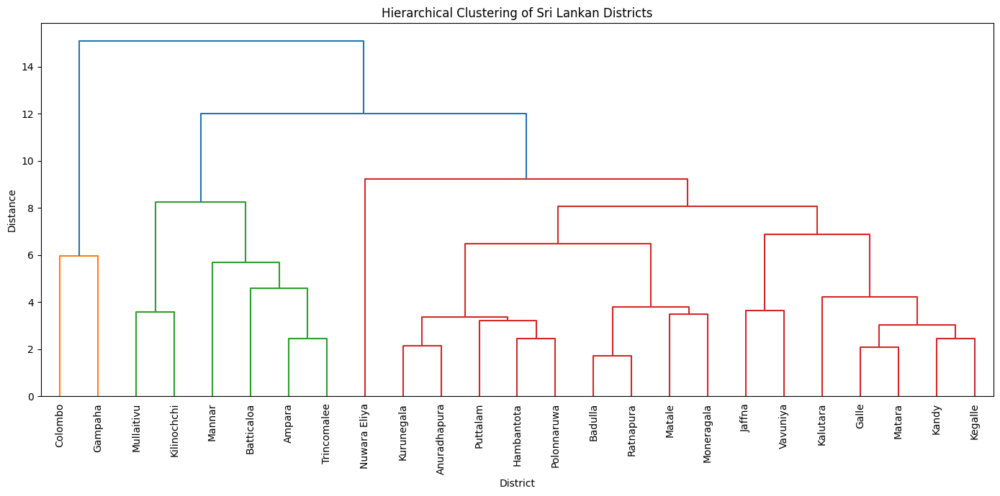

In [160]:
linked = linkage(
    X_scaled,
    method="ward"
)

plt.figure(figsize=(14, 7))

dendrogram(
    linked,
    labels=df["district"].values,
    leaf_rotation=90
)

plt.title(
    "Hierarchical Clustering of Sri Lankan Districts"
)

plt.xlabel("District")
plt.ylabel("Distance")

plt.tight_layout()

plt.show()

In [161]:
iso = IsolationForest(
    contamination=0.12,
    random_state=42
)

df["anomaly"] = iso.fit_predict(X_scaled)

In [162]:
df[
    df["anomaly"] == -1
][
    [
        "district",
        "province",
        "cluster"
    ]
]

,district,province,cluster
0,Colombo,Western,1
5,Nuwara Eliya,Central,2
14,Batticaloa,Eastern,2


In [163]:
df["anomaly_score"] = (
    iso.decision_function(X_scaled)
)

In [164]:
df[
    [
        "district",
        "anomaly_score"
    ]
].sort_values("anomaly_score")

,district,anomaly_score
0,Colombo,-0.102825
5,Nuwara Eliya,-0.004193
14,Batticaloa,-0.000136
1,Gampaha,0.000019
12,Mullaitivu,0.008090
13,Kilinochchi,0.019988
2,Kalutara,0.027529
9,Jaffna,0.043723
16,Trincomalee,0.047073
22,Moneragala,0.047581


In [165]:
loadings = pd.DataFrame(
    pca.components_.T,
    columns=["PC1", "PC2"],
    index=features
)

loadings

,PC1,PC2
avg_annual_population_growth_2012_2024_pct,-0.196764,0.231651
population_density_2024_per_sq_km,0.343648,0.070235
urban_population_pct,0.255455,0.288077
population_under_18_pct,-0.306538,0.210986
disability_rate_per_1000_age5plus,-0.148513,-0.397008
education_no_schooling_pct_age25plus,-0.181696,-0.027678
education_al_or_over_pct_age25plus,0.355639,-0.054222
computer_literacy_rate_pct_age5plus,0.346446,-0.165361
digital_literacy_rate_pct_age5plus,0.313151,0.181326
unemployment_rate_pct,-0.130452,0.447716


In [166]:
loadings.sort_values(
    "PC1",
    key=abs,
    ascending=False
)

,PC1,PC2
education_al_or_over_pct_age25plus,0.355639,-0.054222
computer_literacy_rate_pct_age5plus,0.346446,-0.165361
population_density_2024_per_sq_km,0.343648,0.070235
digital_literacy_rate_pct_age5plus,0.313151,0.181326
population_under_18_pct,-0.306538,0.210986
households_using_gas_for_cooking_pct,0.287835,0.315468
permanent_housing_units_pct,0.278541,-0.006979
urban_population_pct,0.255455,0.288077
water_sealed_toilet_pct,0.228773,0.079190
drinking_water_within_housing_unit_pct,0.220053,-0.286983


In [167]:
loadings.sort_values(
    "PC2",
    key=abs,
    ascending=False
)

,PC1,PC2
unemployment_rate_pct,-0.130452,0.447716
disability_rate_per_1000_age5plus,-0.148513,-0.397008
female_household_heads_pct,-0.040492,0.386870
households_using_gas_for_cooking_pct,0.287835,0.315468
urban_population_pct,0.255455,0.288077
drinking_water_within_housing_unit_pct,0.220053,-0.286983
avg_annual_population_growth_2012_2024_pct,-0.196764,0.231651
net_migration_per_1000_population_derived,-0.010801,0.231543
population_under_18_pct,-0.306538,0.210986
digital_literacy_rate_pct_age5plus,0.313151,0.181326


In [168]:
df.to_csv(
    "sri_lanka_census_2024_ml_results.csv",
    index=False
)

print("Saved!")

Saved!


In [169]:
from google.colab import files

files.download(
    "sri_lanka_census_2024_ml_results.csv"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [170]:
import pandas as pd

results = pd.read_csv("/content/sri_lanka_census_2024_ml_results.csv")

results.head()

,district,province,population_2024,population_share_sri_lanka_pct,avg_annual_population_growth_2012_2024_pct,population_density_2024_per_sq_km,urban_population_pct,estate_urban_population_pct,rural_population_pct,estate_rural_population_pct,...,drinking_water_within_premises_pct,drinking_water_outside_premises_pct,households_using_firewood_for_cooking_pct,households_using_gas_for_cooking_pct,water_sealed_toilet_pct,not_water_sealed_toilet_pct,cluster,hierarchical_cluster,anomaly,anomaly_score
0,Colombo,Western,2375415,10.9,0.2,3551,74.6,0.2,25.0,0.2,...,2.1,0.7,9.9,85.5,99.9,0.1,1,1,-1,-0.102825
1,Gampaha,Western,2436142,11.2,0.4,1776,14.4,0.0,85.6,0.0,...,7.3,3.1,31.8,63.9,99.8,0.2,1,1,1,0.000019
2,Kalutara,Western,1305784,6.0,0.5,805,11.5,0.1,85.8,2.6,...,6.4,3.8,42.4,55.9,99.7,0.3,0,0,1,0.027529
3,Kandy,Central,1461895,6.7,0.5,780,11.7,0.0,82.7,5.6,...,8.9,4.7,58.3,40.3,99.4,0.6,0,0,1,0.084730
4,Matale,Central,526870,2.4,0.7,268,11.9,0.0,84.9,3.2,...,12.7,10.6,75.5,23.5,98.8,1.1,0,0,1,0.124402


In [171]:
results[
    [
        "district",
        "cluster",
        "hierarchical_cluster",
        "anomaly",
        "anomaly_score"
    ]
]

,district,cluster,hierarchical_cluster,anomaly,anomaly_score
0,Colombo,1,1,-1,-0.102825
1,Gampaha,1,1,1,0.000019
2,Kalutara,0,0,1,0.027529
3,Kandy,0,0,1,0.084730
4,Matale,0,0,1,0.124402
5,Nuwara Eliya,2,0,-1,-0.004193
6,Galle,0,0,1,0.104509
7,Matara,0,0,1,0.084053
8,Hambantota,0,0,1,0.118949
9,Jaffna,0,0,1,0.043723


In [172]:
results["cluster"].value_counts().sort_index()

,count
cluster,
0,15
1,2
2,8


In [173]:
for c in sorted(results["cluster"].unique()):

    print("\nCLUSTER", c)

    print(
        results[
            results["cluster"] == c
        ]["district"].tolist()
    )


CLUSTER 0
['Kalutara', 'Kandy', 'Matale', 'Galle', 'Matara', 'Hambantota', 'Jaffna', 'Kurunegala', 'Puttalam', 'Anuradhapura', 'Polonnaruwa', 'Badulla', 'Moneragala', 'Ratnapura', 'Kegalle']

CLUSTER 1
['Colombo', 'Gampaha']

CLUSTER 2
['Nuwara Eliya', 'Mannar', 'Vavuniya', 'Mullaitivu', 'Kilinochchi', 'Batticaloa', 'Ampara', 'Trincomalee']


In [174]:
features = [

    "avg_annual_population_growth_2012_2024_pct",
    "population_density_2024_per_sq_km",
    "urban_population_pct",
    "population_under_18_pct",
    "disability_rate_per_1000_age5plus",

    "education_no_schooling_pct_age25plus",
    "education_al_or_over_pct_age25plus",
    "computer_literacy_rate_pct_age5plus",
    "digital_literacy_rate_pct_age5plus",

    "unemployment_rate_pct",
    "net_migration_per_1000_population_derived",

    "one_person_households_pct",
    "female_household_heads_pct",

    "housing_owned_by_household_member_pct",
    "permanent_housing_units_pct",

    "drinking_water_within_housing_unit_pct",
    "households_using_gas_for_cooking_pct",
    "water_sealed_toilet_pct"
]

In [175]:
cluster_profile = results.groupby("cluster")[features].mean()

cluster_profile.T

cluster,0,1,2
avg_annual_population_growth_2012_2024_pct,0.566667,0.30000,1.087500
population_density_2024_per_sq_km,422.533333,2663.50000,170.750000
urban_population_pct,8.493333,44.50000,14.275000
population_under_18_pct,26.285487,21.78660,29.605300
disability_rate_per_1000_age5plus,37.866667,28.50000,33.375000
education_no_schooling_pct_age25plus,3.066667,1.35000,3.825000
education_al_or_over_pct_age25plus,22.980000,36.30000,18.237500
computer_literacy_rate_pct_age5plus,31.760000,46.85000,23.087500
digital_literacy_rate_pct_age5plus,65.126667,76.20000,64.312500
unemployment_rate_pct,5.593333,5.70000,8.625000


In [176]:
overall_mean = results[features].mean()

comparison = cluster_profile.subtract(overall_mean)

comparison.T

cluster,0,1,2
avg_annual_population_growth_2012_2024_pct,-0.145333,-0.412000,0.375500
population_density_2024_per_sq_km,-98.706667,2142.260000,-350.490000
urban_population_pct,-4.730667,31.276000,1.051000
population_under_18_pct,-0.702429,-5.201316,2.617384
disability_rate_per_1000_age5plus,2.186667,-7.180000,-2.305000
education_no_schooling_pct_age25plus,-0.105333,-1.822000,0.653000
education_al_or_over_pct_age25plus,0.452000,13.772000,-4.290500
computer_literacy_rate_pct_age5plus,1.568000,16.658000,-7.104500
digital_literacy_rate_pct_age5plus,-0.625333,10.448000,-1.439500
unemployment_rate_pct,-0.978667,-0.872000,2.053000


In [177]:
for cluster in comparison.index:

    print("\n======================")
    print("CLUSTER", cluster)
    print("======================")

    values = comparison.loc[cluster]

    print("\nHighest above-average indicators:")
    print(
        values.sort_values(
            ascending=False
        ).head(5)
    )

    print("\nLowest relative indicators:")
    print(
        values.sort_values().head(5)
    )


CLUSTER 0

Highest above-average indicators:
drinking_water_within_housing_unit_pct    8.569333
disability_rate_per_1000_age5plus         2.186667
housing_owned_by_household_member_pct     1.938667
computer_literacy_rate_pct_age5plus       1.568000
education_al_or_over_pct_age25plus        0.452000
Name: 0, dtype: float64

Lowest relative indicators:
population_density_2024_per_sq_km           -98.706667
net_migration_per_1000_population_derived   -33.891075
households_using_gas_for_cooking_pct         -6.069333
urban_population_pct                         -4.730667
female_household_heads_pct                   -1.516000
Name: 0, dtype: float64

CLUSTER 1

Highest above-average indicators:
population_density_2024_per_sq_km            2142.260000
net_migration_per_1000_population_derived     101.657282
households_using_gas_for_cooking_pct           38.224000
urban_population_pct                           31.276000
drinking_water_within_housing_unit_pct         28.176000
Name: 1, dtype: 

In [178]:
pd.crosstab(
    results["cluster"],
    results["hierarchical_cluster"]
)

hierarchical_cluster,0,1,2
cluster,,,
0,15,0,0
1,0,2,0
2,2,0,6


In [179]:
from sklearn.metrics import adjusted_rand_score

ari = adjusted_rand_score(
    results["cluster"],
    results["hierarchical_cluster"]
)

print("Adjusted Rand Index:", round(ari, 3))

Adjusted Rand Index: 0.72


In [180]:
results[
    [
        "district",
        "anomaly",
        "anomaly_score"
    ]
].sort_values(
    "anomaly_score"
)

,district,anomaly,anomaly_score
0,Colombo,-1,-0.102825
5,Nuwara Eliya,-1,-0.004193
14,Batticaloa,-1,-0.000136
1,Gampaha,1,0.000019
12,Mullaitivu,1,0.008090
13,Kilinochchi,1,0.019988
2,Kalutara,1,0.027529
9,Jaffna,1,0.043723
16,Trincomalee,1,0.047073
22,Moneragala,1,0.047581


In [181]:
results[
    results["anomaly"] == -1
][
    [
        "district",
        "cluster",
        "anomaly_score"
    ]
]

,district,cluster,anomaly_score
0,Colombo,1,-0.102825
5,Nuwara Eliya,2,-0.004193
14,Batticaloa,2,-0.000136


In [182]:
summary = results[
    [
        "district",
        "province",
        "cluster",
        "hierarchical_cluster",
        "anomaly",
        "anomaly_score"
    ]
].copy()

summary

,district,province,cluster,hierarchical_cluster,anomaly,anomaly_score
0,Colombo,Western,1,1,-1,-0.102825
1,Gampaha,Western,1,1,1,0.000019
2,Kalutara,Western,0,0,1,0.027529
3,Kandy,Central,0,0,1,0.084730
4,Matale,Central,0,0,1,0.124402
5,Nuwara Eliya,Central,2,0,-1,-0.004193
6,Galle,Southern,0,0,1,0.104509
7,Matara,Southern,0,0,1,0.084053
8,Hambantota,Southern,0,0,1,0.118949
9,Jaffna,Northern,0,0,1,0.043723


In [183]:
summary.to_csv(
    "district_ml_summary.csv",
    index=False
)

In [184]:
!pip install geopandas folium plotly -q

In [185]:
import geopandas as gpd
import folium
import plotly.express as px

In [186]:
results["district"].unique()

array(['Colombo', 'Gampaha', 'Kalutara', 'Kandy', 'Matale',
       'Nuwara Eliya', 'Galle', 'Matara', 'Hambantota', 'Jaffna',
       'Mannar', 'Vavuniya', 'Mullaitivu', 'Kilinochchi', 'Batticaloa',
       'Ampara', 'Trincomalee', 'Kurunegala', 'Puttalam', 'Anuradhapura',
       'Polonnaruwa', 'Badulla', 'Moneragala', 'Ratnapura', 'Kegalle'],
      dtype=object)

In [187]:
import geopandas as gpd

geo = gpd.read_file("/content/LKA_ADM2.geojson")

print(geo.columns)
print(geo.shape)
geo.head()

Index(['id', 'NAME', 'Level', 'ISO_Code', 'iso', 'adm', 'adm_int',
       'feature_id', 'gbid', 'geometry'],
      dtype='object')
(25, 10)


,id,NAME,Level,ISO_Code,iso,adm,adm_int,feature_id,gbid,geometry
0,0,Jaffna District,ADM2,LK-41,LKA,ADM2,2,0,LKA_ADM2_1_3_3_0,"MULTIPOLYGON (((79.7152 9.52947, 79.71764 9.52..."
1,1,Kilinochchi District,ADM2,LK-42,LKA,ADM2,2,1,LKA_ADM2_1_3_3_1,"MULTIPOLYGON (((80.01015 9.4724, 80.00964 9.47..."
2,2,Mannar District,ADM2,LK-43,LKA,ADM2,2,2,LKA_ADM2_1_3_3_2,"MULTIPOLYGON (((80.11535 9.20907, 80.11708 9.2..."
3,3,Mullaitivu District,ADM2,LK-45,LKA,ADM2,2,3,LKA_ADM2_1_3_3_3,"POLYGON ((80.17502 8.95029, 80.17617 8.9518, 8..."
4,4,Vavuniya District,ADM2,LK-44,LKA,ADM2,2,4,LKA_ADM2_1_3_3_4,"POLYGON ((80.16996 8.7522, 80.17289 8.75686, 8..."


In [188]:
geo.shape
geo.columns

Index(['id', 'NAME', 'Level', 'ISO_Code', 'iso', 'adm', 'adm_int',
       'feature_id', 'gbid', 'geometry'],
      dtype='object')

In [189]:
print("Shape:", geo.shape)
print("Number of areas:", len(geo))

Shape: (25, 10)
Number of areas: 25


In [190]:
geo["NAME"].unique()

array(['Jaffna District', 'Kilinochchi District', 'Mannar District',
       'Mullaitivu District', 'Vavuniya District', 'Galle District',
       'Hambantota District', 'Matara District', 'Ampara District',
       'Anuradhapura District', 'Badulla District', 'Batticaloa District',
       'Monaragala District', 'Polonnaruwa District', 'Colombo District',
       'Gampaha District', 'Kalutara District', 'Kegalle District',
       'Kurunegala District', 'Puttalam District', 'Ratnapura District',
       'Kandy District', 'Matale District', 'Nuwara Eliya District',
       'Trincomalee District'], dtype=object)

In [191]:
geo["Level"].unique()

array(['ADM2'], dtype=object)

In [192]:
print("GeoJSON:")
print(sorted(geo["NAME"].unique()))

print("\nCensus CSV:")
print(sorted(results["district"].unique()))

GeoJSON:
['Ampara District', 'Anuradhapura District', 'Badulla District', 'Batticaloa District', 'Colombo District', 'Galle District', 'Gampaha District', 'Hambantota District', 'Jaffna District', 'Kalutara District', 'Kandy District', 'Kegalle District', 'Kilinochchi District', 'Kurunegala District', 'Mannar District', 'Matale District', 'Matara District', 'Monaragala District', 'Mullaitivu District', 'Nuwara Eliya District', 'Polonnaruwa District', 'Puttalam District', 'Ratnapura District', 'Trincomalee District', 'Vavuniya District']

Census CSV:
['Ampara', 'Anuradhapura', 'Badulla', 'Batticaloa', 'Colombo', 'Galle', 'Gampaha', 'Hambantota', 'Jaffna', 'Kalutara', 'Kandy', 'Kegalle', 'Kilinochchi', 'Kurunegala', 'Mannar', 'Matale', 'Matara', 'Moneragala', 'Mullaitivu', 'Nuwara Eliya', 'Polonnaruwa', 'Puttalam', 'Ratnapura', 'Trincomalee', 'Vavuniya']


In [193]:
geo.shape
geo["NAME"].unique()

array(['Jaffna District', 'Kilinochchi District', 'Mannar District',
       'Mullaitivu District', 'Vavuniya District', 'Galle District',
       'Hambantota District', 'Matara District', 'Ampara District',
       'Anuradhapura District', 'Badulla District', 'Batticaloa District',
       'Monaragala District', 'Polonnaruwa District', 'Colombo District',
       'Gampaha District', 'Kalutara District', 'Kegalle District',
       'Kurunegala District', 'Puttalam District', 'Ratnapura District',
       'Kandy District', 'Matale District', 'Nuwara Eliya District',
       'Trincomalee District'], dtype=object)

In [194]:
geo["district"] = geo["NAME"].str.replace(" District", "", regex=False)

print(sorted(geo["district"].unique()))

['Ampara', 'Anuradhapura', 'Badulla', 'Batticaloa', 'Colombo', 'Galle', 'Gampaha', 'Hambantota', 'Jaffna', 'Kalutara', 'Kandy', 'Kegalle', 'Kilinochchi', 'Kurunegala', 'Mannar', 'Matale', 'Matara', 'Monaragala', 'Mullaitivu', 'Nuwara Eliya', 'Polonnaruwa', 'Puttalam', 'Ratnapura', 'Trincomalee', 'Vavuniya']


In [195]:
print("GeoJSON districts:", len(geo["district"].unique()))
print("CSV districts:", len(results["district"].unique()))

print("\nMissing from GeoJSON:")
print(set(results["district"]) - set(geo["district"]))

print("\nMissing from CSV:")
print(set(geo["district"]) - set(results["district"]))

GeoJSON districts: 25
CSV districts: 25

Missing from GeoJSON:
{'Moneragala'}

Missing from CSV:
{'Monaragala'}


In [196]:
geo_ml = geo.merge(
    results,
    on="district",
    how="left"
)

print(geo_ml.shape)
geo_ml.head()

(25, 67)


,id,NAME,Level,ISO_Code,iso,adm,adm_int,feature_id,gbid,geometry,...,drinking_water_within_premises_pct,drinking_water_outside_premises_pct,households_using_firewood_for_cooking_pct,households_using_gas_for_cooking_pct,water_sealed_toilet_pct,not_water_sealed_toilet_pct,cluster,hierarchical_cluster,anomaly,anomaly_score
0,0,Jaffna District,ADM2,LK-41,LKA,ADM2,2,0,LKA_ADM2_1_3_3_0,"MULTIPOLYGON (((79.7152 9.52947, 79.71764 9.52...",...,40.1,29.4,54.7,42.3,99.9,0.1,0.0,0.0,1.0,0.043723
1,1,Kilinochchi District,ADM2,LK-42,LKA,ADM2,2,1,LKA_ADM2_1_3_3_1,"MULTIPOLYGON (((80.01015 9.4724, 80.00964 9.47...",...,65.5,19.8,77.3,21.2,99.3,0.6,2.0,2.0,1.0,0.019988
2,2,Mannar District,ADM2,LK-43,LKA,ADM2,2,2,LKA_ADM2_1_3_3_2,"MULTIPOLYGON (((80.11535 9.20907, 80.11708 9.2...",...,54.0,16.7,55.9,41.1,99.1,0.9,2.0,2.0,1.0,0.054529
3,3,Mullaitivu District,ADM2,LK-45,LKA,ADM2,2,3,LKA_ADM2_1_3_3_3,"POLYGON ((80.17502 8.95029, 80.17617 8.9518, 8...",...,47.4,24.0,73.8,24.5,99.6,0.4,2.0,2.0,1.0,0.008090
4,4,Vavuniya District,ADM2,LK-44,LKA,ADM2,2,4,LKA_ADM2_1_3_3_4,"POLYGON ((80.16996 8.7522, 80.17289 8.75686, 8...",...,50.1,22.9,56.5,41.9,99.2,0.8,2.0,0.0,1.0,0.068738


In [197]:
geo_ml[["district", "cluster"]]

,district,cluster
0,Jaffna,0.0
1,Kilinochchi,2.0
2,Mannar,2.0
3,Mullaitivu,2.0
4,Vavuniya,2.0
5,Galle,0.0
6,Hambantota,0.0
7,Matara,0.0
8,Ampara,2.0
9,Anuradhapura,0.0


In [198]:
geo_ml["cluster"].isnull().sum()

np.int64(1)

In [199]:
geo["district"] = geo["district"].replace({
    "Monaragala": "Moneragala"
})

In [200]:
print("Missing from GeoJSON:")
print(set(results["district"]) - set(geo["district"]))

print("\nMissing from CSV:")
print(set(geo["district"]) - set(results["district"]))

Missing from GeoJSON:
set()

Missing from CSV:
set()


In [201]:
geo_ml = geo.merge(
    results,
    on="district",
    how="left"
)

In [202]:
print("Missing clusters:", geo_ml["cluster"].isnull().sum())

Missing clusters: 0


In [203]:
geo_ml["cluster"].isnull().sum()

np.int64(0)

In [204]:
import folium

# Create base map
m = folium.Map(
    location=[7.87, 80.77],
    zoom_start=7,
    tiles="CartoDB positron"
)

# Add district polygons colored by cluster
folium.Choropleth(
    geo_data=geo_ml,
    data=geo_ml,
    columns=["district", "cluster"],
    key_on="feature.properties.district",
    fill_color="YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name="ML Cluster"
).add_to(m)

m

In [205]:
tooltip = folium.GeoJsonTooltip(
    fields=[
        "district",
        "cluster",
        "population_2024",
        "digital_literacy_rate_pct_age5plus",
        "unemployment_rate_pct",
        "education_al_or_over_pct_age25plus"
    ],
    aliases=[
        "District:",
        "Cluster:",
        "Population:",
        "Digital Literacy (%):",
        "Unemployment Rate (%):",
        "A/L or Higher (%):"
    ],
    localize=True,
    sticky=False,
    labels=True
)

In [206]:
m2 = folium.Map(
    location=[7.87, 80.77],
    zoom_start=7,
    tiles="CartoDB positron"
)

folium.GeoJson(
    geo_ml,
    style_function=lambda feature: {
        "fillOpacity": 0.7,
        "weight": 1
    },
    tooltip=tooltip
).add_to(m2)

m2

In [207]:
m3 = folium.Map(
    location=[7.87, 80.77],
    zoom_start=7,
    tiles=None
)

In [208]:
cluster_colors = {
    0: "#1f77b4",
    1: "#2ca02c",
    2: "#ff7f0e"
}

m3 = folium.Map(
    location=[7.87, 80.77],
    zoom_start=7,
    tiles=None
)

folium.GeoJson(
    geo_ml,
    style_function=lambda feature: {
        "fillColor": cluster_colors.get(
            int(feature["properties"]["cluster"]),
            "#808080"
        ),
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.75
    },
    tooltip=tooltip
).add_to(m3)

m3

In [209]:
legend_html = """
<div style="
position: fixed;
bottom: 50px;
left: 50px;
width: 160px;
background-color: white;
border:2px solid grey;
z-index:9999;
font-size:14px;
padding:10px;
">
<b>ML Clusters</b><br>
<span style="color:#1f77b4;">■</span> Cluster 0<br>
<span style="color:#2ca02c;">■</span> Cluster 1<br>
<span style="color:#ff7f0e;">■</span> Cluster 2
</div>
"""

m3.get_root().html.add_child(
    folium.Element(legend_html)
)

m3

In [210]:
tooltip = folium.GeoJsonTooltip(
    fields=[
        "district",
        "cluster",
        "population_2024",
        "population_density_2024_per_sq_km",
        "digital_literacy_rate_pct_age5plus",
        "computer_literacy_rate_pct_age5plus",
        "education_al_or_over_pct_age25plus",
        "unemployment_rate_pct",
        "anomaly_score"
    ],
    aliases=[
        "District:",
        "ML Cluster:",
        "Population:",
        "Population Density:",
        "Digital Literacy (%):",
        "Computer Literacy (%):",
        "A/L or Higher (%):",
        "Unemployment Rate (%):",
        "Anomaly Score:"
    ],
    sticky=True
)

In [211]:
cluster_colors = {
    0: "#1f77b4",
    1: "#2ca02c",
    2: "#ff7f0e"
}

m4 = folium.Map(
    location=[7.87, 80.77],
    zoom_start=7,
    tiles=None
)

folium.GeoJson(
    geo_ml,
    style_function=lambda feature: {
        "fillColor": cluster_colors.get(
            int(feature["properties"]["cluster"]),
            "#808080"
        ),
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.75
    },
    highlight_function=lambda feature: {
        "weight": 3,
        "fillOpacity": 0.9
    },
    tooltip=tooltip
).add_to(m4)

In [212]:
legend_html = """
<div style="
position: fixed;
bottom: 50px;
left: 50px;
width: 170px;
background-color: white;
border:2px solid grey;
z-index:9999;
font-size:14px;
padding:10px;
">
<b>ML District Clusters</b><br>
<span style="color:#1f77b4;">■</span> Cluster 0<br>
<span style="color:#2ca02c;">■</span> Cluster 1<br>
<span style="color:#ff7f0e;">■</span> Cluster 2
</div>
"""

m4.get_root().html.add_child(
    folium.Element(legend_html)
)

m4

In [213]:
cluster_profile = results.groupby("cluster")[features].mean()

cluster_profile.T

cluster,0,1,2
avg_annual_population_growth_2012_2024_pct,0.566667,0.30000,1.087500
population_density_2024_per_sq_km,422.533333,2663.50000,170.750000
urban_population_pct,8.493333,44.50000,14.275000
population_under_18_pct,26.285487,21.78660,29.605300
disability_rate_per_1000_age5plus,37.866667,28.50000,33.375000
education_no_schooling_pct_age25plus,3.066667,1.35000,3.825000
education_al_or_over_pct_age25plus,22.980000,36.30000,18.237500
computer_literacy_rate_pct_age5plus,31.760000,46.85000,23.087500
digital_literacy_rate_pct_age5plus,65.126667,76.20000,64.312500
unemployment_rate_pct,5.593333,5.70000,8.625000


In [214]:
overall_mean = results[features].mean()

comparison = cluster_profile.subtract(overall_mean)

comparison.T

cluster,0,1,2
avg_annual_population_growth_2012_2024_pct,-0.145333,-0.412000,0.375500
population_density_2024_per_sq_km,-98.706667,2142.260000,-350.490000
urban_population_pct,-4.730667,31.276000,1.051000
population_under_18_pct,-0.702429,-5.201316,2.617384
disability_rate_per_1000_age5plus,2.186667,-7.180000,-2.305000
education_no_schooling_pct_age25plus,-0.105333,-1.822000,0.653000
education_al_or_over_pct_age25plus,0.452000,13.772000,-4.290500
computer_literacy_rate_pct_age5plus,1.568000,16.658000,-7.104500
digital_literacy_rate_pct_age5plus,-0.625333,10.448000,-1.439500
unemployment_rate_pct,-0.978667,-0.872000,2.053000


In [215]:
for cluster in comparison.index:

    print("\n======================")
    print("CLUSTER", cluster)
    print("======================")

    print("\nTop 5 above-average indicators:")
    print(
        comparison.loc[cluster]
        .sort_values(ascending=False)
        .head(5)
    )

    print("\nTop 5 below-average indicators:")
    print(
        comparison.loc[cluster]
        .sort_values()
        .head(5)
    )


CLUSTER 0

Top 5 above-average indicators:
drinking_water_within_housing_unit_pct    8.569333
disability_rate_per_1000_age5plus         2.186667
housing_owned_by_household_member_pct     1.938667
computer_literacy_rate_pct_age5plus       1.568000
education_al_or_over_pct_age25plus        0.452000
Name: 0, dtype: float64

Top 5 below-average indicators:
population_density_2024_per_sq_km           -98.706667
net_migration_per_1000_population_derived   -33.891075
households_using_gas_for_cooking_pct         -6.069333
urban_population_pct                         -4.730667
female_household_heads_pct                   -1.516000
Name: 0, dtype: float64

CLUSTER 1

Top 5 above-average indicators:
population_density_2024_per_sq_km            2142.260000
net_migration_per_1000_population_derived     101.657282
households_using_gas_for_cooking_pct           38.224000
urban_population_pct                           31.276000
drinking_water_within_housing_unit_pct         28.176000
Name: 1, dtype: 

In [216]:
for cluster in sorted(results["cluster"].unique()):

    print("\nCLUSTER", cluster)

    print(
        results[
            results["cluster"] == cluster
        ]["district"].tolist()
    )


CLUSTER 0
['Kalutara', 'Kandy', 'Matale', 'Galle', 'Matara', 'Hambantota', 'Jaffna', 'Kurunegala', 'Puttalam', 'Anuradhapura', 'Polonnaruwa', 'Badulla', 'Moneragala', 'Ratnapura', 'Kegalle']

CLUSTER 1
['Colombo', 'Gampaha']

CLUSTER 2
['Nuwara Eliya', 'Mannar', 'Vavuniya', 'Mullaitivu', 'Kilinochchi', 'Batticaloa', 'Ampara', 'Trincomalee']


In [217]:
cluster_names = {
    0: "Predominantly Rural, Moderate Socioeconomic Profile",
    1: "High-Density Urban & Digitally Connected Profile",
    2: "Lower-Density, Infrastructure-Constrained Profile"
}

results["cluster_name"] = results["cluster"].map(cluster_names)
geo_ml["cluster_name"] = geo_ml["cluster"].map(cluster_names)

In [218]:
results[
    ["district", "cluster", "cluster_name"]
].sort_values("cluster")

,district,cluster,cluster_name
3,Kandy,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
2,Kalutara,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
6,Galle,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
4,Matale,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
7,Matara,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
8,Hambantota,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
9,Jaffna,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
17,Kurunegala,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
24,Kegalle,0,"Predominantly Rural, Moderate Socioeconomic Pr..."
23,Ratnapura,0,"Predominantly Rural, Moderate Socioeconomic Pr..."


In [219]:
cluster_names = {
    0: "Predominantly Rural, Moderate Socioeconomic Profile",
    1: "High-Density Urban & Digitally Connected Profile",
    2: "Lower-Density, Infrastructure-Constrained Profile"
}

geo_ml["cluster_name"] = geo_ml["cluster"].map(cluster_names)

In [220]:
tooltip = folium.GeoJsonTooltip(
    fields=[
        "district",
        "cluster_name",
        "population_2024",
        "population_density_2024_per_sq_km",
        "digital_literacy_rate_pct_age5plus",
        "computer_literacy_rate_pct_age5plus",
        "education_al_or_over_pct_age25plus",
        "unemployment_rate_pct",
        "anomaly_score"
    ],
    aliases=[
        "District:",
        "District Profile:",
        "Population:",
        "Population Density:",
        "Digital Literacy (%):",
        "Computer Literacy (%):",
        "A/L or Higher (%):",
        "Unemployment Rate (%):",
        "Anomaly Score:"
    ],
    sticky=True
)

In [221]:
cluster_colors = {
    0: "#1f77b4",
    1: "#2ca02c",
    2: "#ff7f0e"
}

final_map = folium.Map(
    location=[7.87, 80.77],
    zoom_start=7,
    tiles=None
)

folium.GeoJson(
    geo_ml,
    style_function=lambda feature: {
        "fillColor": cluster_colors.get(
            int(feature["properties"]["cluster"]),
            "#808080"
        ),
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.75
    },
    highlight_function=lambda feature: {
        "weight": 3,
        "fillOpacity": 0.9
    },
    tooltip=tooltip
).add_to(final_map)

In [222]:
legend_html = """
<div style="
position: fixed;
bottom: 50px;
left: 50px;
width: 270px;
background-color: white;
border:2px solid grey;
z-index:9999;
font-size:13px;
padding:10px;
">
<b>District Socioeconomic Profiles</b><br><br>

<span style="color:#1f77b4;">■</span>
Predominantly Rural, Moderate Profile<br><br>

<span style="color:#2ca02c;">■</span>
High-Density Urban & Digitally Connected<br><br>

<span style="color:#ff7f0e;">■</span>
Lower-Density, Infrastructure-Constrained

</div>
"""

final_map.get_root().html.add_child(
    folium.Element(legend_html)
)

final_map

In [223]:
tooltip = folium.GeoJsonTooltip(
    fields=[
        "district",
        "cluster_name",
        "digital_literacy_rate_pct_age5plus",
        "unemployment_rate_pct"
    ],
    aliases=[
        "District:",
        "Profile:",
        "Digital Literacy (%):",
        "Unemployment Rate (%):"
    ],
    sticky=False
)

In [224]:
popup = folium.GeoJsonPopup(
    fields=[
        "district",
        "population_2024",
        "population_density_2024_per_sq_km",
        "digital_literacy_rate_pct_age5plus",
        "computer_literacy_rate_pct_age5plus",
        "education_al_or_over_pct_age25plus",
        "unemployment_rate_pct",
        "anomaly_score"
    ],
    aliases=[
        "District:",
        "Population:",
        "Population Density:",
        "Digital Literacy (%):",
        "Computer Literacy (%):",
        "A/L or Higher (%):",
        "Unemployment Rate (%):",
        "Anomaly Score:"
    ]
)

In [225]:
final_map = folium.Map(
    location=[7.87, 80.77],
    zoom_start=7,
    tiles=None
)

folium.GeoJson(
    geo_ml,
    style_function=lambda feature: {
        "fillColor": cluster_colors.get(
            int(feature["properties"]["cluster"]),
            "#808080"
        ),
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.75
    },
    highlight_function=lambda feature: {
        "weight": 3,
        "fillOpacity": 0.9
    },
    tooltip=tooltip,
    popup=popup
).add_to(final_map)

final_map.get_root().html.add_child(
    folium.Element(legend_html)
)

final_map

In [226]:
final_map.save(
    "sri_lanka_census_ml_cluster_map.html"
)

In [229]:
from google.colab import files

files.download(
    "sri_lanka_census_ml_cluster_map.html"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

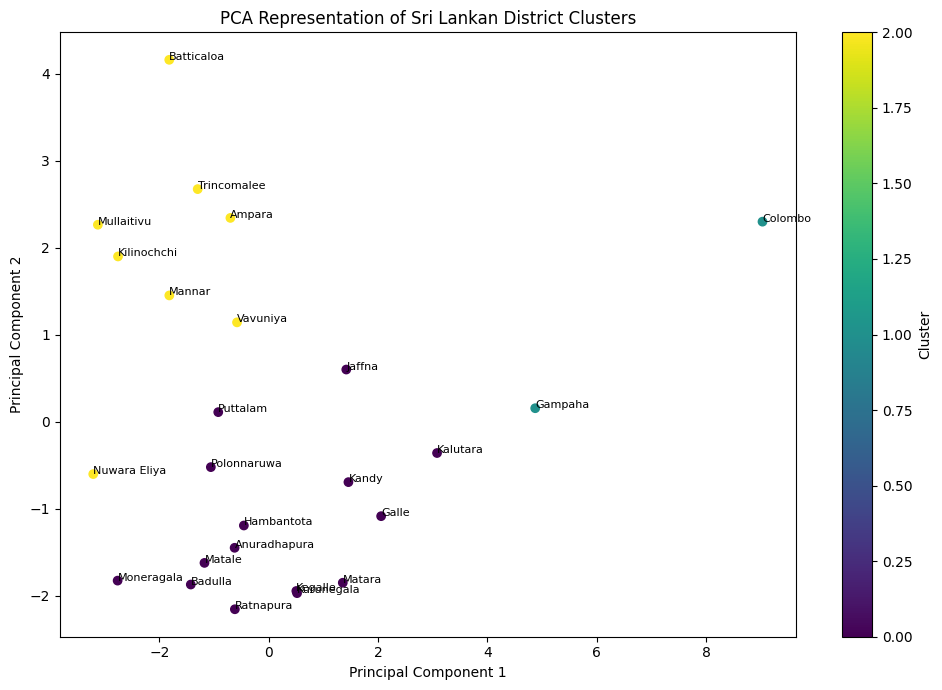

In [230]:
plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    X_pca[:, 0],
    X_pca[:, 1],
    c=results["cluster"]
)

for i, district in enumerate(results["district"]):
    plt.annotate(
        district,
        (X_pca[i, 0], X_pca[i, 1]),
        fontsize=8
    )

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Representation of Sri Lankan District Clusters")

plt.colorbar(scatter, label="Cluster")
plt.tight_layout()

plt.savefig(
    "pca_clusters.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [231]:
from google.colab import files

files.download("pca_clusters.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

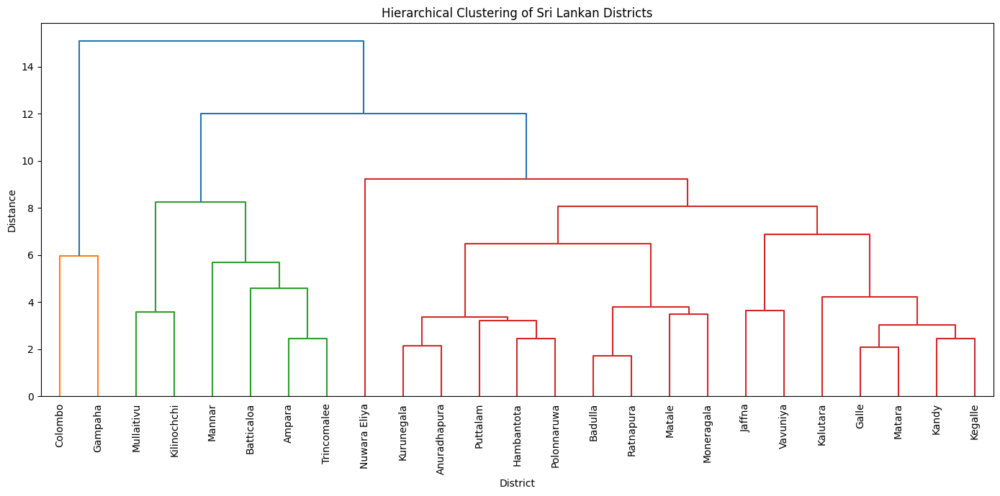

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [234]:
from scipy.cluster.hierarchy import linkage, dendrogram

linked = linkage(
    X_scaled,
    method="ward"
)

plt.figure(figsize=(14, 7))

dendrogram(
    linked,
    labels=results["district"].values,
    leaf_rotation=90
)

plt.title("Hierarchical Clustering of Sri Lankan Districts")
plt.xlabel("District")
plt.ylabel("Distance")

plt.tight_layout()

plt.savefig(
    "dendrogram.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()
files.download("dendrogram.png")

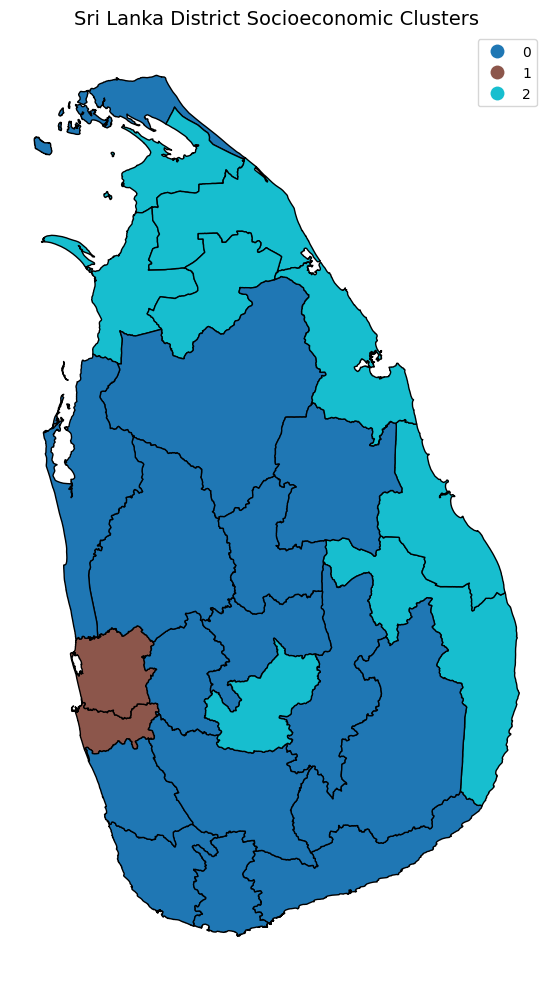

In [235]:
fig, ax = plt.subplots(figsize=(8, 10))

geo_ml.plot(
    column="cluster",
    categorical=True,
    legend=True,
    ax=ax,
    edgecolor="black"
)

ax.set_title(
    "Sri Lanka District Socioeconomic Clusters",
    fontsize=14
)

ax.axis("off")

plt.tight_layout()

plt.savefig(
    "cluster_map.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [236]:
files.download("cluster_map.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [237]:
plt.savefig("elbow_method.png", dpi=300, bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

In [238]:
plt.savefig("silhouette_scores.png", dpi=300, bbox_inches="tight")

<Figure size 640x480 with 0 Axes>